In [1]:
import os
import math
import warnings
warnings.filterwarnings("ignore")

import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing
from plotly import tools
import plotly.graph_objs as go
from plotly.offline import iplot, init_notebook_mode
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

init_notebook_mode(connected=True)
pd.set_option('display.max_columns', 5000)

# Read the CSV file

In [2]:
df = pd.read_csv('./data/multipleChoiceResponses.csv').iloc[1:,:]
df.head(3)

,Time from Start to Finish (seconds),Q1,Q1_OTHER_TEXT,Q2,Q3,Q4,Q5,Q6,Q6_OTHER_TEXT,Q7,Q7_OTHER_TEXT,Q8,Q9,Q10,Q11_Part_1,Q11_Part_2,Q11_Part_3,Q11_Part_4,Q11_Part_5,Q11_Part_6,Q11_Part_7,Q11_OTHER_TEXT,Q12_MULTIPLE_CHOICE,Q12_Part_1_TEXT,Q12_Part_2_TEXT,Q12_Part_3_TEXT,Q12_Part_4_TEXT,Q12_Part_5_TEXT,Q12_OTHER_TEXT,Q13_Part_1,Q13_Part_2,Q13_Part_3,Q13_Part_4,Q13_Part_5,Q13_Part_6,Q13_Part_7,Q13_Part_8,Q13_Part_9,Q13_Part_10,Q13_Part_11,Q13_Part_12,Q13_Part_13,Q13_Part_14,Q13_Part_15,Q13_OTHER_TEXT,Q14_Part_1,Q14_Part_2,Q14_Part_3,Q14_Part_4,Q14_Part_5,Q14_Part_6,Q14_Part_7,Q14_Part_8,Q14_Part_9,Q14_Part_10,Q14_Part_11,Q14_OTHER_TEXT,Q15_Part_1,Q15_Part_2,Q15_Part_3,Q15_Part_4,Q15_Part_5,Q15_Part_6,Q15_Part_7,Q15_OTHER_TEXT,Q16_Part_1,Q16_Part_2,Q16_Part_3,Q16_Part_4,Q16_Part_5,Q16_Part_6,Q16_Part_7,Q16_Part_8,Q16_Part_9,Q16_Part_10,Q16_Part_11,Q16_Part_12,Q16_Part_13,Q16_Part_14,Q16_Part_15,Q16_Part_16,Q16_Part_17,Q16_Part_18,Q16_OTHER_TEXT,Q17,Q17_OTHER_TEXT,Q18,Q18_OTHER_TEXT,Q19_Part_1,Q19_Part_2,Q19_Part_3,Q19_Part_4,Q19_Part_5,Q19_Part_6,Q19_Part_7,Q19_Part_8,Q19_Part_9,Q19_Part_10,Q19_Part_11,Q19_Part_12,Q19_Part_13,Q19_Part_14,Q19_Part_15,Q19_Part_16,Q19_Part_17,Q19_Part_18,Q19_Part_19,Q19_OTHER_TEXT,Q20,Q20_OTHER_TEXT,Q21_Part_1,Q21_Part_2,Q21_Part_3,Q21_Part_4,Q21_Part_5,Q21_Part_6,Q21_Part_7,Q21_Part_8,Q21_Part_9,Q21_Part_10,Q21_Part_11,Q21_Part_12,Q21_Part_13,Q21_OTHER_TEXT,Q22,Q22_OTHER_TEXT,Q23,Q24,Q25,Q26,Q27_Part_1,Q27_Part_2,Q27_Part_3,Q27_Part_4,Q27_Part_5,Q27_Part_6,Q27_Part_7,Q27_Part_8,Q27_Part_9,Q27_Part_10,Q27_Part_11,Q27_Part_12,Q27_Part_13,Q27_Part_14,Q27_Part_15,Q27_Part_16,Q27_Part_17,Q27_Part_18,Q27_Part_19,Q27_Part_20,Q27_OTHER_TEXT,Q28_Part_1,Q28_Part_2,Q28_Part_3,Q28_Part_4,Q28_Part_5,Q28_Part_6,Q28_Part_7,Q28_Part_8,Q28_Part_9,Q28_Part_10,Q28_Part_11,Q28_Part_12,Q28_Part_13,Q28_Part_14,Q28_Part_15,Q28_Part_16,Q28_Part_17,Q28_Part_18,Q28_Part_19,Q28_Part_20,Q28_Part_21,Q28_Part_22,Q28_Part_23,Q28_Part_24,Q28_Part_25,Q28_Part_26,Q28_Part_27,Q28_Part_28,Q28_Part_29,Q28_Part_30,Q28_Part_31,Q28_Part_32,Q28_Part_33,Q28_Part_34,Q28_Part_35,Q28_Part_36,Q28_Part_37,Q28_Part_38,Q28_Part_39,Q28_Part_40,Q28_Part_41,Q28_Part_42,Q28_Part_43,Q28_OTHER_TEXT,Q29_Part_1,Q29_Part_2,Q29_Part_3,Q29_Part_4,Q29_Part_5,Q29_Part_6,Q29_Part_7,Q29_Part_8,Q29_Part_9,Q29_Part_10,Q29_Part_11,Q29_Part_12,Q29_Part_13,Q29_Part_14,Q29_Part_15,Q29_Part_16,Q29_Part_17,Q29_Part_18,Q29_Part_19,Q29_Part_20,Q29_Part_21,Q29_Part_22,Q29_Part_23,Q29_Part_24,Q29_Part_25,Q29_Part_26,Q29_Part_27,Q29_Part_28,Q29_OTHER_TEXT,Q30_Part_1,Q30_Part_2,Q30_Part_3,Q30_Part_4,Q30_Part_5,Q30_Part_6,Q30_Part_7,Q30_Part_8,Q30_Part_9,Q30_Part_10,Q30_Part_11,Q30_Part_12,Q30_Part_13,Q30_Part_14,Q30_Part_15,Q30_Part_16,Q30_Part_17,Q30_Part_18,Q30_Part_19,Q30_Part_20,Q30_Part_21,Q30_Part_22,Q30_Part_23,Q30_Part_24,Q30_Part_25,Q30_OTHER_TEXT,Q31_Part_1,Q31_Part_2,Q31_Part_3,Q31_Part_4,Q31_Part_5,Q31_Part_6,Q31_Part_7,Q31_Part_8,Q31_Part_9,Q31_Part_10,Q31_Part_11,Q31_Part_12,Q31_OTHER_TEXT,Q32,Q32_OTHER,Q33_Part_1,Q33_Part_2,Q33_Part_3,Q33_Part_4,Q33_Part_5,Q33_Part_6,Q33_Part_7,Q33_Part_8,Q33_Part_9,Q33_Part_10,Q33_Part_11,Q33_OTHER_TEXT,Q34_Part_1,Q34_Part_2,Q34_Part_3,Q34_Part_4,Q34_Part_5,Q34_Part_6,Q34_OTHER_TEXT,Q35_Part_1,Q35_Part_2,Q35_Part_3,Q35_Part_4,Q35_Part_5,Q35_Part_6,Q35_OTHER_TEXT,Q36_Part_1,Q36_Part_2,Q36_Part_3,Q36_Part_4,Q36_Part_5,Q36_Part_6,Q36_Part_7,Q36_Part_8,Q36_Part_9,Q36_Part_10,Q36_Part_11,Q36_Part_12,Q36_Part_13,Q36_OTHER_TEXT,Q37,Q37_OTHER_TEXT,Q38_Part_1,Q38_Part_2,Q38_Part_3,Q38_Part_4,Q38_Part_5,Q38_Part_6,Q38_Part_7,Q38_Part_8,Q38_Part_9,Q38_Part_10,Q38_Part_11,Q38_Part_12,Q38_Part_13,Q38_Part_14,Q38_Part_15,Q38_Part_16,Q38_Part_17,Q38_Part_18,Q38_Part_19,Q38_Part_20,Q38_Part_21,Q38_Part_22,Q38_OTHER_TEXT,Q39_Part_1,Q39_Part_2,Q40,Q41_Part_1,Q41_Part_2,Q41_Part_3,Q42_Part_1,Q42_Part_2,Q42_Part_3,Q42_Part_4,Q42_Part_5,Q42_OTHER_TEXT,Q43,Q44_Part_1,Q44_Part_2,Q44_Part_3,Q44_Part_4,Q44_Part_5,Q44_Part_6,Q45_Part_1,Q45_Part_2,Q45_P

# Scope defining

This EDA focuses on difference of job contents amaong different job titles, therefore, I will only consider the respondents who have a clear job title. For those who don't selected "Others" or "Not employed" or "Students", it's quite hard and unfair to be included in this analysis.

In [3]:
CONSIDERED_JOB_TITLE = ['Business Analyst', 'Chief Officer', 'Consultant',
       'DBA/Database Engineer', 'Data Analyst', 'Data Engineer',
       'Data Journalist', 'Data Scientist', 'Developer Advocate',
       'Manager', 'Marketing Analyst','Principal Investigator', 'Product/Project Manager',
       'Research Assistant', 'Research Scientist', 'Salesperson',
       'Software Engineer', 'Statistician']

df_jobs = df.loc[df["Q6"].isin(CONSIDERED_JOB_TITLE)]

In [4]:
df_plot = df_jobs['Q6'].value_counts(ascending=True)  # or use plot_df[::-1] to reverse the order

# Number of respondants of different job titles, in both quantities and percentages

Since Kaggle is mainly used by people related with data science, so there is no surprise that most of the respondants for the survey are data scientists.

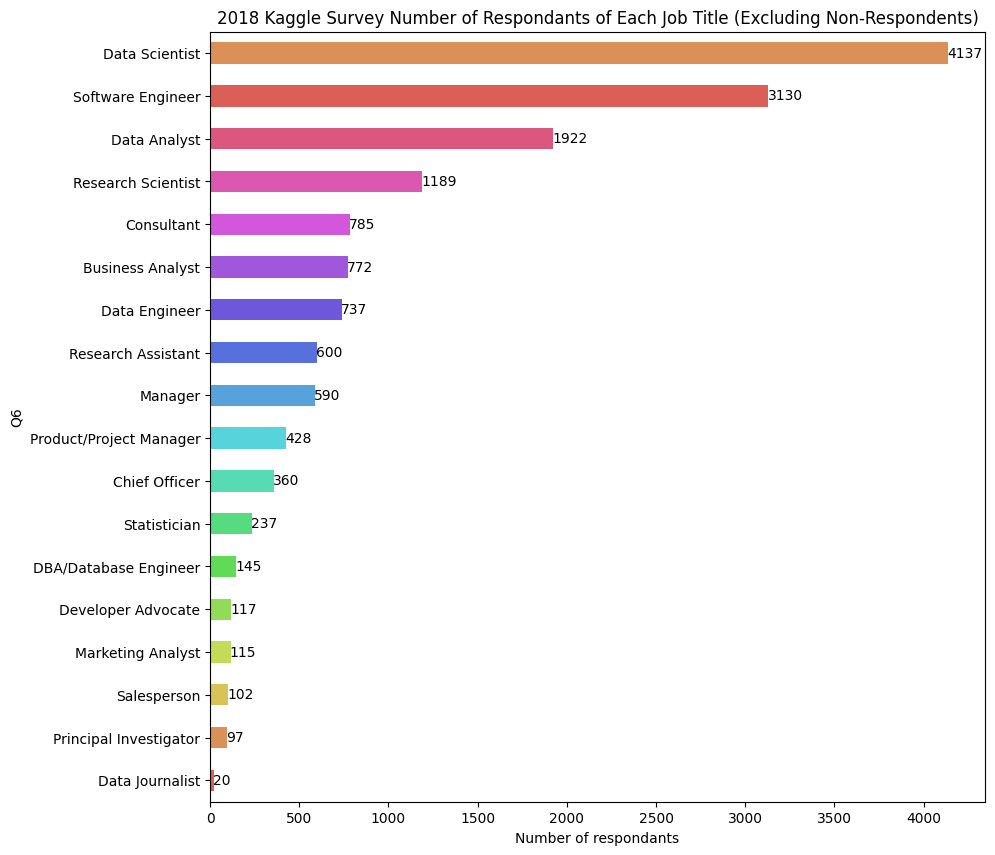

In [5]:
color_pal = sns.color_palette('hls', 16)
ax = df_plot.plot(kind='barh', figsize=(10, 10),
          title='2018 Kaggle Survey Number of Respondants of Each Job Title (Excluding Non-Respondents)',
          color=color_pal)
for i, (p, pr) in enumerate(zip(df_plot.index, df_plot.values)):
    plt.text(s=str(pr), x=pr-5, y=i, color="k",
             verticalalignment="center", horizontalalignment="left", size=10)
ax.set_xlabel("Number of respondants")
plt.show()

In [6]:
# Create another pd.Series to show the percentage of each category
df_plot_perc = pd.Series((df_plot.values / df_plot.sum() *100).round(2), index = df_plot.index)

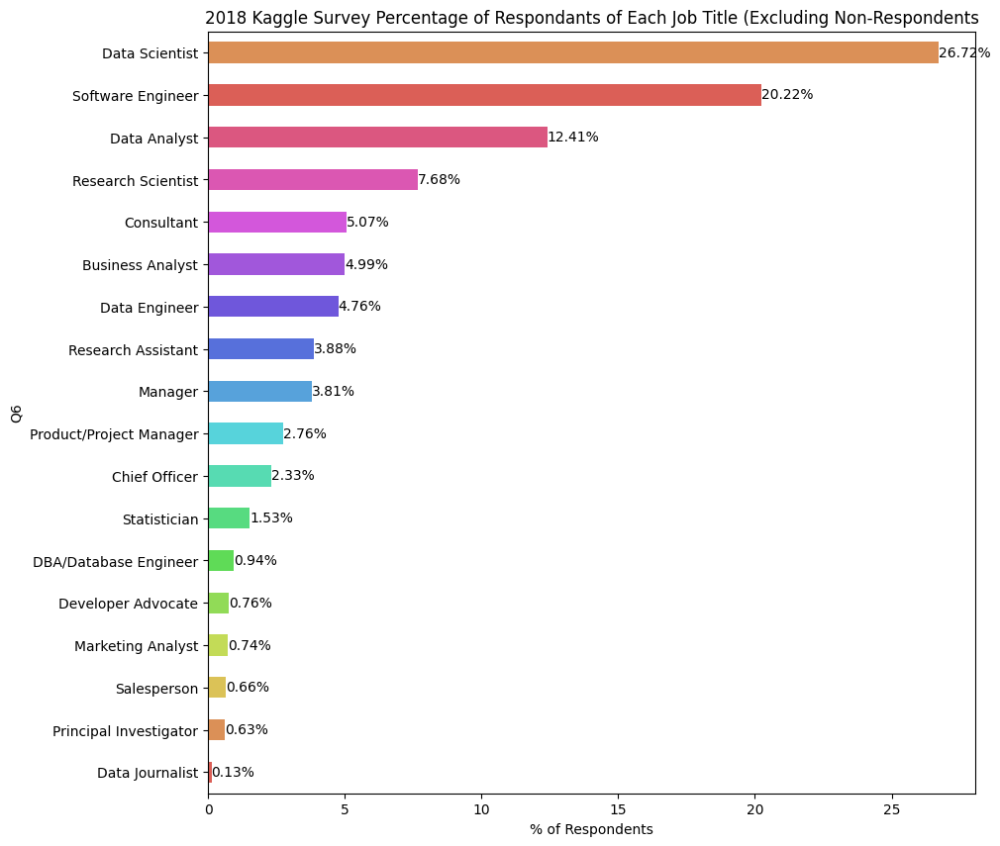

In [7]:
ax = df_plot_perc.plot(kind='barh', figsize=(10, 10),
          title='2018 Kaggle Survey Percentage of Respondants of Each Job Title (Excluding Non-Respondents',
          color=color_pal)
for i, (p, pr) in enumerate(zip(df_plot_perc.index, df_plot_perc.values)):
    plt.text(s=str(pr)+"%", x=pr, y=i, color="k",
             verticalalignment="center", horizontalalignment="left", size=10)
ax.set_xlabel("% of Respondents")
plt.show()

# Check how much time of their time is devoted to coding for people with different jobs

In [8]:
print(df[["Q6", "Q23"]].dropna().groupby(["Q6", "Q23"]).size().groupby("Q6")
      .apply(lambda x: 100 * x / float(x.sum()))
      .unstack(2).columns)


Index(['0% of my time', '1% to 25% of my time', '100% of my time',
       '25% to 49% of my time', '50% to 74% of my time',
       '75% to 99% of my time'],
      dtype='object', name='Q23')


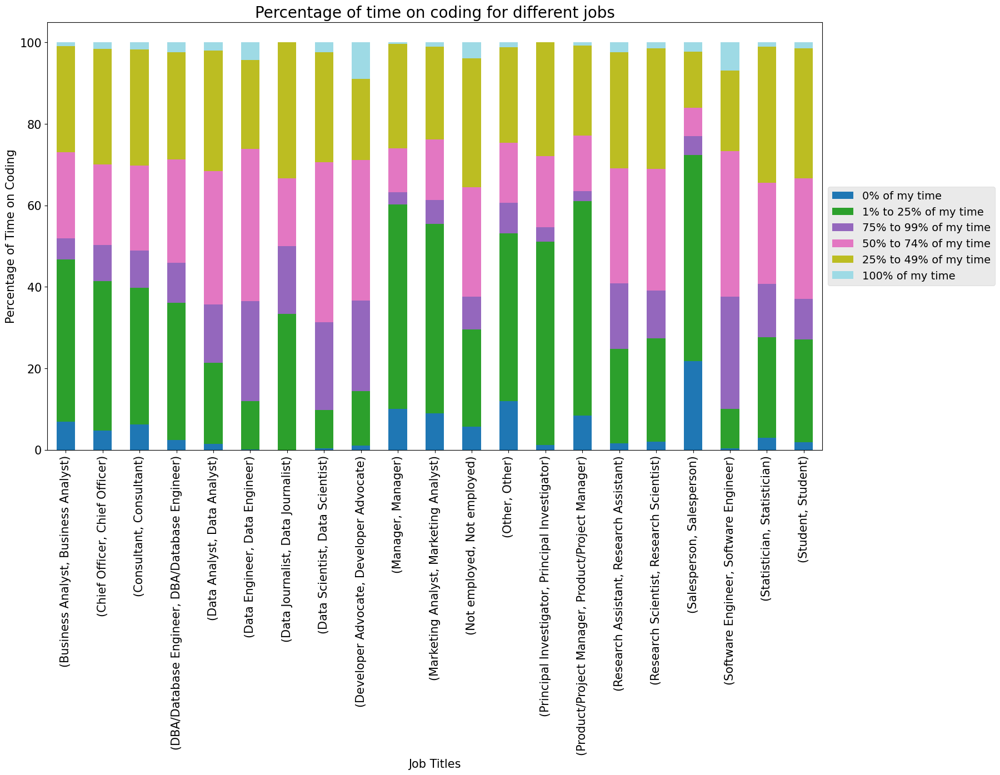

In [9]:
CODING_TIME = ['0% of my time', '1% to 25% of my time', '75% to 99% of my time',
              '50% to 74% of my time', '25% to 49% of my time',
              '100% of my time']

df[["Q6", "Q23"]]\
        .dropna().groupby(["Q6", "Q23"]).size()\
        .groupby("Q6").apply(lambda x: 100 * x / float(x.sum()))\
        .unstack(2)[CODING_TIME]\
        .plot(kind="bar", stacked=True, figsize=(18, 10), 
              fontsize=15, colormap=plt.get_cmap("tab20")
             )

plt.style.use("ggplot")
plt.title("Percentage of time on coding for different jobs", fontsize=20)
plt.ylabel("Percentage of Time on Coding", fontsize=15)
plt.xlabel("Job Titles", fontsize=15)
plt.legend(loc="center left", bbox_to_anchor=(1.0, 0.5), fontsize=14)
plt.show()


### Take away

1. As the result presents, for occupations that are quite technical, like data scientist, data engineer, software engineers, most of them spend at least half of their time in coding!

2. For managers, chiefs and salesperson, they spend least of time in coding, which is quite common sense. Their focus is not coding but business, strategy etc.

3. And analysts are looking like positions in between, on the one hand, they will analyze the data and find insights, and on the other hand, they work closely with business and engineers.

# Look into the influence of levels of degrees on the jobs

In [10]:
df['Q4'].value_counts()

Q4
Master’s degree                                                      10855
Bachelor’s degree                                                     7083
Doctoral degree                                                       3357
Some college/university study without earning a bachelor’s degree      967
Professional degree                                                    599
I prefer not to answer                                                 345
No formal education past high school                                   232
Name: count, dtype: int64

In [11]:
labels = df['Q4'].value_counts().index
sizes = df['Q4'].value_counts()

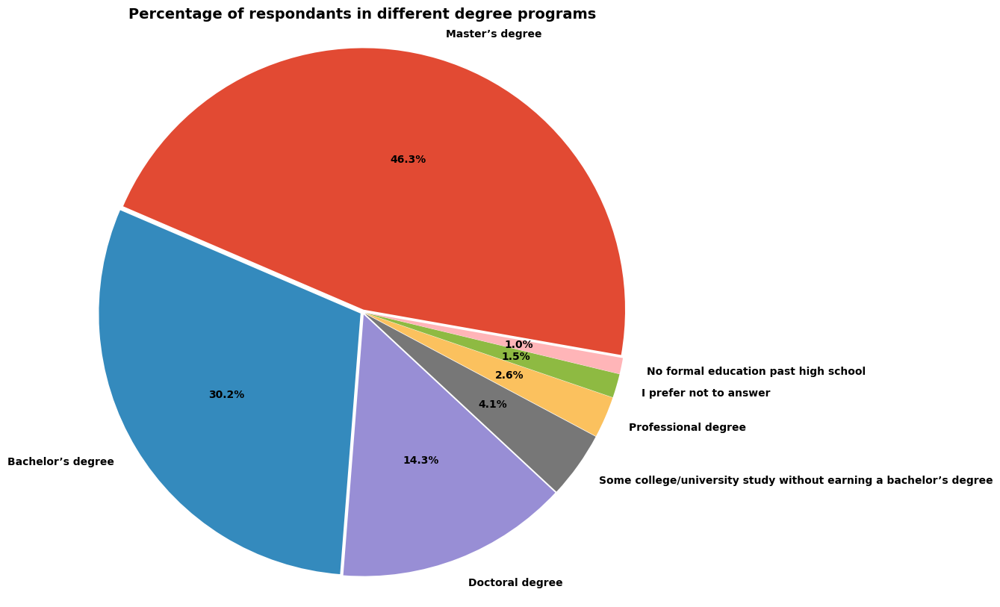

In [12]:
explode = (0.01,0.01,0.01,0.01,0.01,0.01,0.01)
fig, ax = plt.subplots(figsize=(10,10))
ax.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
       shadow=False, startangle=-10, textprops={'weight':'bold'})
ax.axis('equal')
plt.title('Percentage of respondants in different degree programs', fontsize=14, weight='bold')
plt.show()

### Take away

1. Since data science is a multi-displinary topic that requires high level knowledge of computer science and statistics, therefore, over 91% of respondants have a college degree

2. 46.3% of people obtain a Masters degree, which shows the high requirement of this job

# Look into the distribution of levels of degrees in selected jobs

In [13]:
Selected_job_titles = ['Business Analyst', 'Chief Officer', 'Consultant',
        'Data Analyst', 'Data Engineer','Data Scientist', 'Manager', 'Product/Project Manager',
       'Research Assistant', 'Research Scientist', 'Software Engineer', 'Statistician']

# find the subset of the dataset from the selected job titles
df_selected_jobs = df.loc[df["Q6"].isin(Selected_job_titles)]

job_bachelor = df_selected_jobs[df_selected_jobs['Q4'] == 'Bachelor’s degree'].groupby('Q6').size()
job_master = df_selected_jobs[df_selected_jobs['Q4'] == 'Master’s degree'].groupby('Q6').size()
job_doctor = df_selected_jobs[df_selected_jobs['Q4'] == 'Doctoral degree'].groupby('Q6').size()
job_others = df_selected_jobs[df_selected_jobs['Q4'] == 'Some college/university study without earning a bachelor’s degree'].groupby('Q6').size() 

In [14]:
job_data = pd.concat([job_bachelor,job_master,job_doctor,job_others], axis=1, sort=True)
job_data.columns = ['Bachelor','Masters','Doctoral','Others']
job_data['Total'] = job_data.sum(axis=1)


Text(0.5, 1.0, 'Number of Respondent with different levels of degrees')

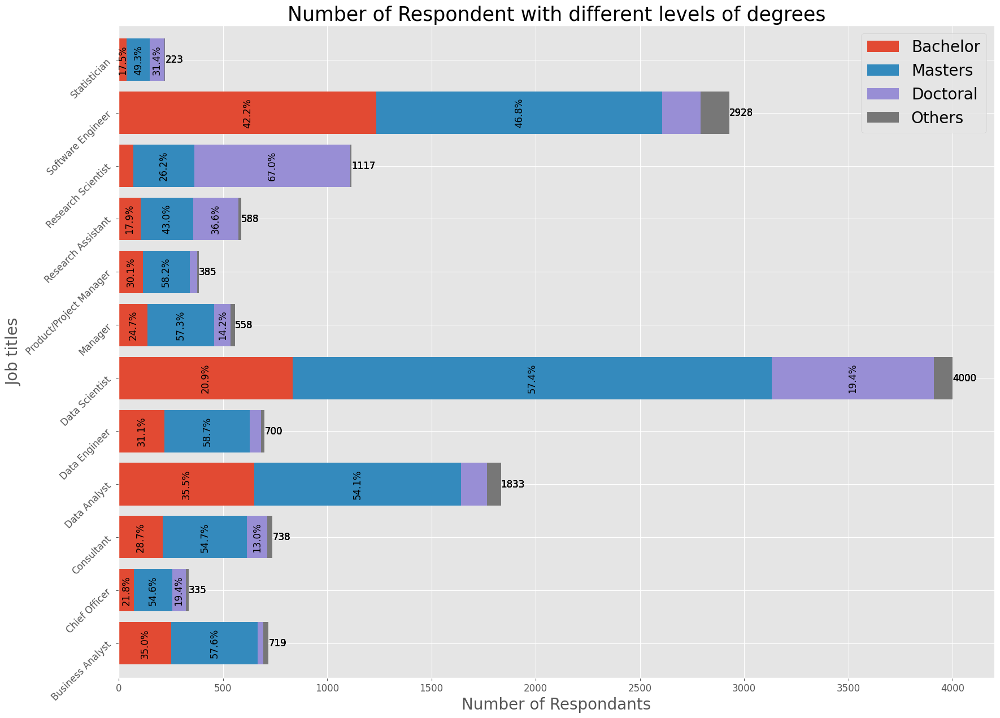

In [15]:
job_data.drop(['Total'], axis=1).plot(kind='barh',stacked=True,figsize=(20,15),width=.8)
total=job_data['Total']
df_rel = job_data[job_data.columns[0:4]].div(total,0)*100

for n in df_rel:
    for i, (cs, ab, pc, tot) in enumerate(zip(job_data.iloc[:, 0:].cumsum(1)[n], job_data[n], df_rel[n], total)):
        plt.text(tot, i, str(tot), va='center', fontsize=12)
        if pc >= 10 and tot>100:
            plt.text(cs - ab/2, i, str(np.round(pc, 1)) + '%', va='center', ha='center', fontsize=12, rotation=90)
        
plt.legend(fontsize=20)
plt.xlabel("Number of Respondants", fontsize=20)
plt.ylabel("Job titles", fontsize=20)
plt.yticks(rotation=45, fontsize=12)
plt.xticks(fontsize=12)
plt.title("Number of Respondent with different levels of degrees", fontsize=25, color='k')    

### Take away

1. It seems that a Masters degree is important if someone is trying to break into the world of data science

2. For jobs that need research and development, a doctorate degree is usually desired, which can be seen in the high percentage of doctorate degrees owners in jobs such as Statistician (31.4%), Research Scientist (67.0%) and Research Assistant (36.6%)

# Look into the relationship between coding expereince and the type of job

In [16]:
CODING_YEAR = ['I have never written code and I do not want to learn',
        'I have never written code but I want to learn', '< 1 year', '1-2 years', 
        '3-5 years', '5-10 years', '10-20 years', '20-30 years', 
        '30-40 years', '40+ years']
df_code_year = df_jobs[["Q6", "Q24"]]\
        .groupby(["Q6", "Q24"])\
        .size()\
        .to_frame("counts")\
        .unstack(1)\
        .fillna(0)
df_code_year = df_code_year["counts"][CODING_YEAR]

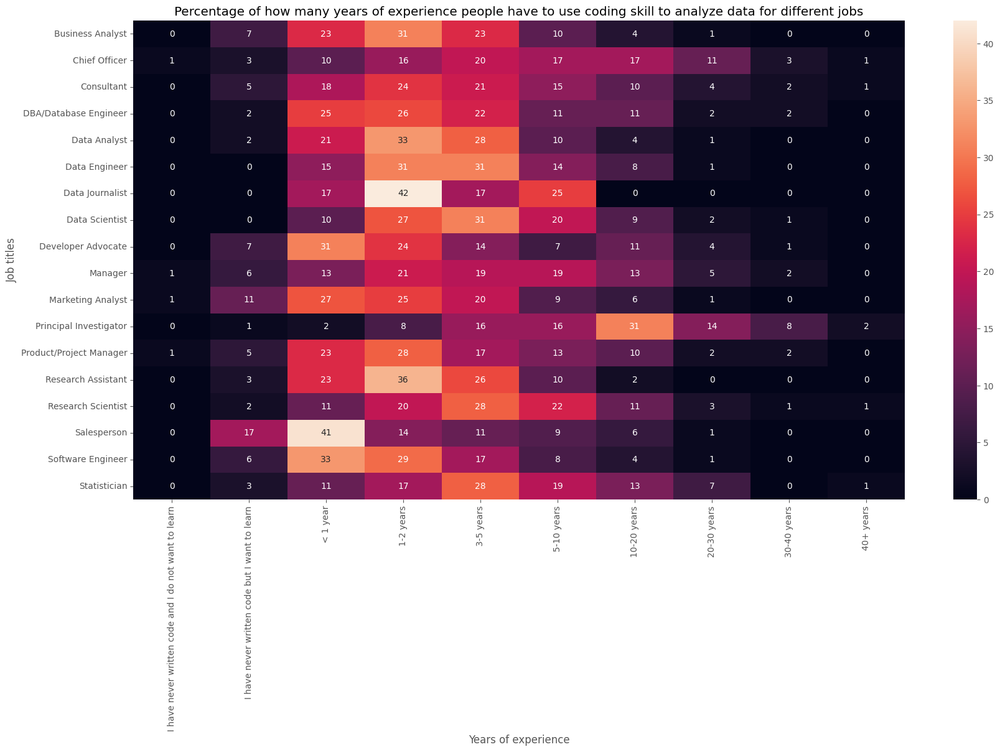

In [17]:
df_code_year = df_code_year.apply(lambda x: ((x / df_code_year.sum(axis=1)) * 100).round(0))
plt.figure(figsize=(20, 10))
sns.heatmap(df_code_year, annot=True)
_ = plt.title("Percentage of how many years of experience people have to use coding skill to analyze data for different jobs")
_ = plt.xlabel("Years of experience")
_ = plt.ylabel("Job titles")

### Take away

1. As we can see, for some positions, especially high level positions, like chief/principal, althgough right now, it looks like they are not coding, based on the figure above, most of them have lots of years of coding experience. It's quite easy to understand, a good leader should be very familiar to the work, and thus be able to lead and plan the project.

2. Don't be afraid! Most of people have similar experience as you! We could see that most of people in these technical positions have less than 5 years of using code to analyze data.

# Discover the amount of time spent on the data project for different jobs

In [18]:
WORK_DETAILS = ['Gathering data', 'Cleaning data', 
            'Visualizing data', 'Model building/model selection', 
            'Putting the model into production', 
            'Finding insights in the data and communicating with stakeholders']
df_time = df_jobs.filter(regex=("^(?!.*TEXT)(Q6|Q34)"), axis=1)\
                .dropna()
df_time.columns = ["Q6"] + WORK_DETAILS
df_time[WORK_DETAILS] = df_time[WORK_DETAILS].astype(float)

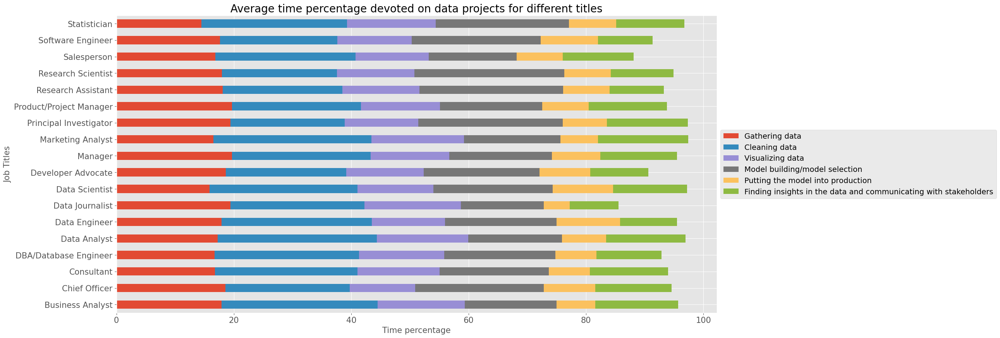

In [19]:
df_time.groupby("Q6").agg(np.mean)\
    .plot.barh(stacked=True, figsize=(20, 10), fontsize=15)

plt.title("Average time percentage devoted on data projects for different titles", fontsize=20)
plt.ylabel("Job Titles", fontsize=15)
plt.xlabel("Time percentage", fontsize=15)
plt.legend(loc="center left", bbox_to_anchor=(1.0, 0.5), fontsize=14)
plt.show()

# A look at the daily job task for different jobs

In [20]:
columns_q11 = [column for column in df_jobs.columns if (column.startswith('Q11_Part') or column == 'Q6') ]
df_role = df_jobs[columns_q11]
columns_q11.remove('Q6')
for column in columns_q11:
    df_temp = df_role[column]
    value = df_temp.loc[df_temp.first_valid_index()]
    df_role = df_role.rename(columns = {column: value})

In [21]:
groups_role = df_role.groupby('Q6')
groups_role_pct = pd.DataFrame()
for name, group in groups_role:
    groups_role_pct[name] = pd.Series(group.notnull().mean()*100)
groups_role_pct = groups_role_pct.unstack().to_frame().reset_index()
groups_role_pct = groups_role_pct.loc[groups_role_pct['level_1'] !='Q6']
groups_role_pct = groups_role_pct.rename(columns = {'level_0': 'Q3', 'level_1': 'role', 0: 'count'})

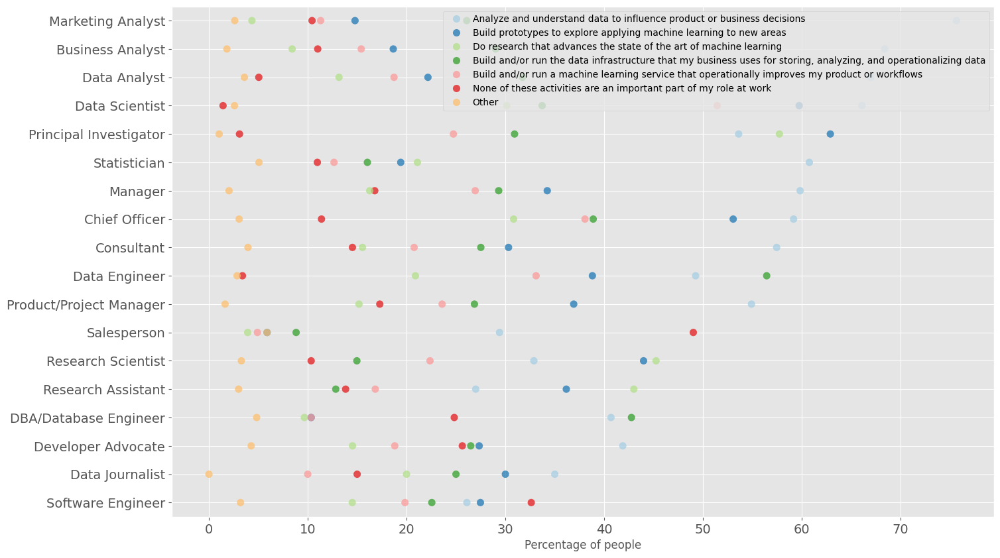

In [22]:
colors =sns.color_palette("Paired", 14)
groups_role_pct = groups_role_pct.sort_values(['count'], ascending=False)
order = groups_role_pct['Q3'].unique()
fig, ax = plt.subplots(figsize=(16, 10))
ax = sns.stripplot(ax=ax, x='count', y="Q3", hue='role', data=groups_role_pct,
                   palette=colors, jitter=False, size=8, alpha=.75, 
                   edgecolor="black", order=order)
ax.set_xlabel('Percentage of people')
ax.set_ylabel('')
ax.xaxis.grid(True)
ax.yaxis.grid(True)
ax.tick_params(labelsize=14)

plt.legend()

# Look into the most common programming software for differet jobs

In [23]:
job_index = df_jobs.index
df_ffr = pd.read_csv("./data/freeFormResponses.csv", low_memory=False).filter(regex="Q12").iloc[job_index, :]
drop_cols = df_ffr.columns.tolist()

In [24]:
TOOLS = ['jupyter', 'python', 'pycharm', 'anaconda', 'matlab', 'rstudio', 'visual studio', 'excel', 'docker', 'sql'
    , 'bash', 'spark', 'scala', 'emacs', 'tensor', 'torch', 'scikit', 'xgb', 'hadoop', 'jupyterlab', 'cloudera'
, 'c++', 'tableau', 'pandas', 'keras', 'ide', 'orange', 'colab', 'aws', 'mxnet', 'databricks', 'spyder', 'java',
'h2o', 'slack', 'zeppelin', 'sas', 'spss', 'nltk', 'powerbi']

df_ffr["summary"] = df_ffr.apply(lambda x: set([i for i in x if i is not np.nan]), axis=1)
df_ffr["summary"] = df_ffr["summary"].apply(lambda x: [i.lower() for i in x])
df_ffr = df_ffr[df_ffr["summary"].apply(lambda x: len(x)) == 1]



In [25]:
for t in TOOLS:
    df_ffr[t] = 0
    
for idx, r in df_ffr.iterrows():
    for t in TOOLS:
        if t in r['summary'][0]:
            df_ffr.at[idx, t] = 1
            
drop_cols = drop_cols + ["summary"]
df_tool = df_ffr.merge(df_jobs[['Q6']], right_index=True, left_index=True)\
        .drop(drop_cols, axis=1)

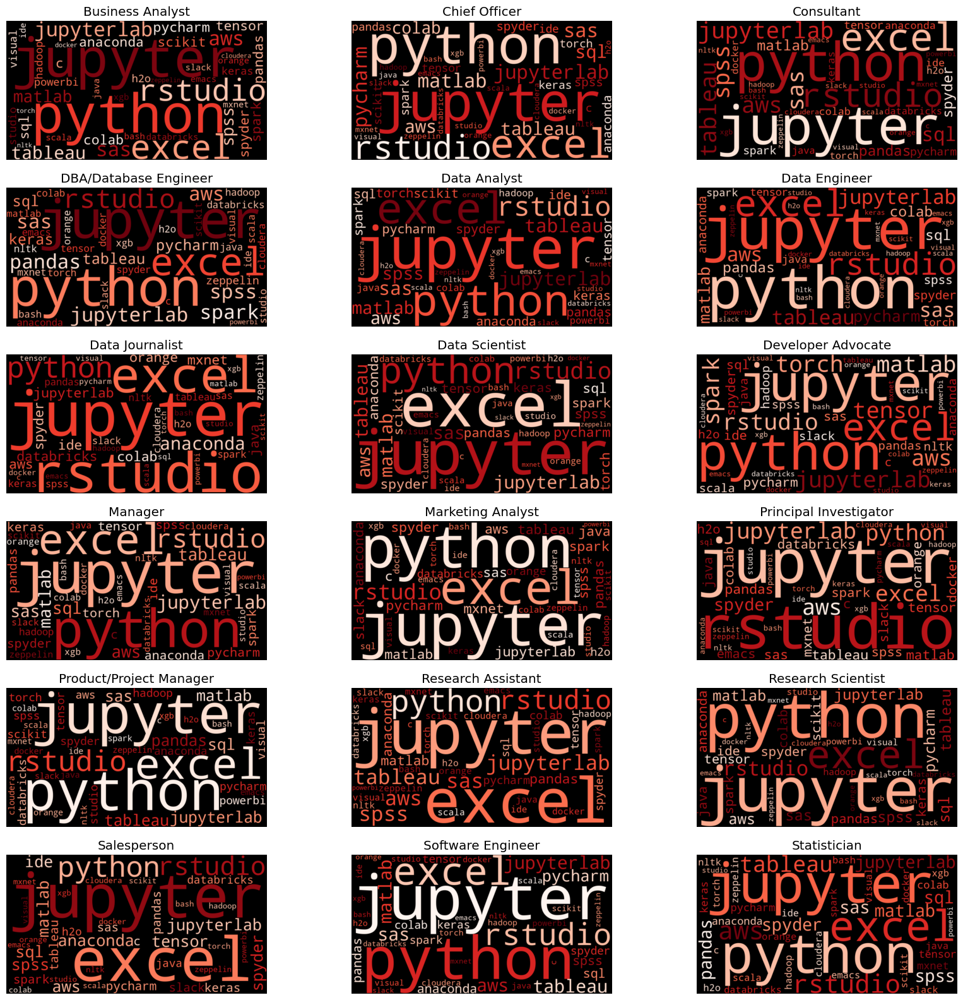

In [26]:
fig, ax = plt.subplots(nrows=6, ncols=3, sharex=True, sharey=True, figsize=(20, 20))
n = 1
for job in CONSIDERED_JOB_TITLE:
    sub_job = df_tool[df_tool["Q6"] == job]
    txt = ",".join(sub_job[TOOLS].sum(axis=0).sort_values(ascending=False).index)
    plt.subplot(6, 3, n)
    wordcloud = WordCloud(colormap="Reds", width=900, height=480,
                      normalize_plurals=False).generate(txt)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(job)
    plt.axis("off")
    n +=1
plt.subplots_adjust(hspace = 0.2)
plt.show()


### Take away

1. Jupyter are very widely used nowadays.

2. Python, excel and Rstudio are coming after! We can aware that for the occupations that need storytelling or interpretation, Rstudio are very popular! It's not hard to understand since R is a very nice tool for visualization.

3. Excel are still popular. And they are even more popular among data scientist!! hope it is because my mistake in transforming data :)

# Check through which channel people learn ML/DS 

In [27]:
responses = df[1:]
responses = responses[~pd.isnull(responses['Q35_Part_1'])]

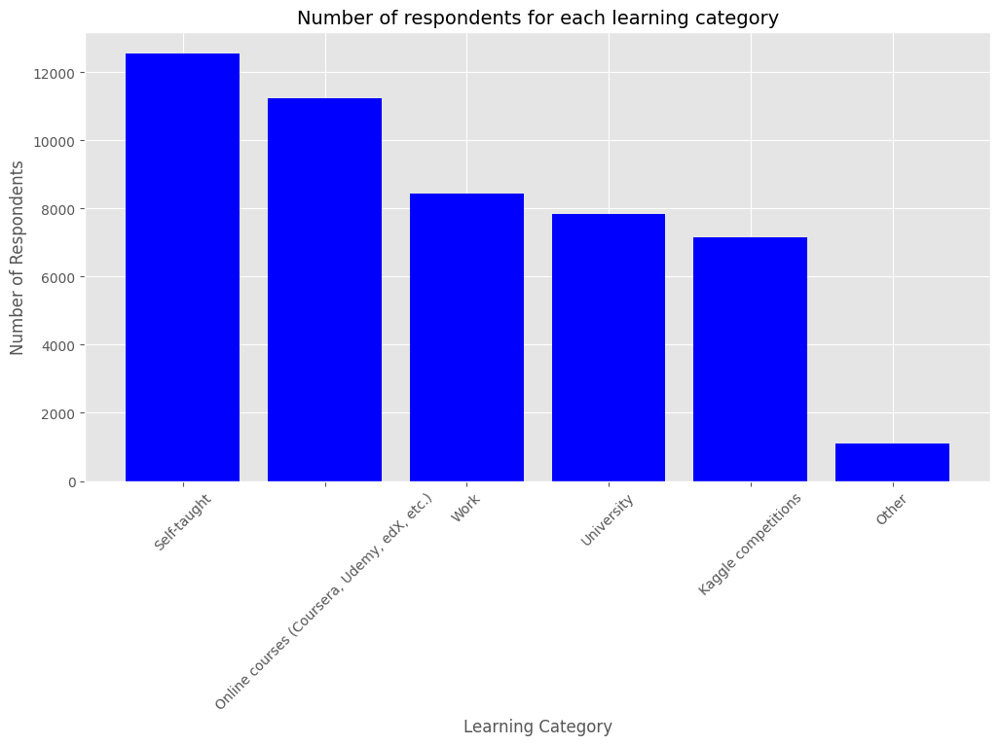

In [28]:
count_dict = {
    'Self-taught' : (responses['Q35_Part_1'].astype(float)>0).sum(),
    'Online courses (Coursera, Udemy, edX, etc.)' : (responses['Q35_Part_2'].astype(float)>0).sum(),
    'Work' : (responses['Q35_Part_3'].astype(float)>0).sum(),
    'University' : (responses['Q35_Part_4'].astype(float)>0).sum(),
    'Kaggle competitions' : (responses['Q35_Part_5'].astype(float)>0).sum(),
    'Other' : (responses['Q35_Part_6'].astype(float)>0).sum()
}

cnt_srs = pd.Series(count_dict)

# Vẽ biểu đồ bằng Matplotlib
plt.figure(figsize=(12, 6))  # Kích thước biểu đồ
plt.bar(cnt_srs.index, cnt_srs.values, color='blue')  # Vẽ cột

# Tùy chỉnh tiêu đề và nhãn
plt.title('Number of respondents for each learning category', fontsize=14)
plt.xlabel('Learning Category', fontsize=12)
plt.ylabel('Number of Respondents', fontsize=12)
plt.xticks(rotation=45)  # Xoay nhãn trục X cho dễ đọc

# Hiển thị biểu đồ
plt.show()

In [29]:
responses['Q35_Part_5'].loc[responses['Q35_Part_5'].astype(float)<0] = 0   

ys = [responses['Q35_Part_1'].values, 
      responses['Q35_Part_2'].values,
      responses['Q35_Part_3'].values,
      responses['Q35_Part_4'].values,
      responses['Q35_Part_5'].values,
      responses['Q35_Part_6'].values
     ]
names = ["Self-taught",
         'Online courses (Coursera, Udemy, edX, etc.)',
         'Work',
         'University',
         'Kaggle competitions',
         'Other'
        ]
#colors = ['rgba(93, 164, 214, 0.5)', 'rgba(255, 144, 14, 0.5)', 'rgba(44, 160, 101, 0.5)', 'rgba(255, 65, 54, 0.5)', 'rgba(207, 114, 255, 0.5)', 'rgba(127, 96, 0, 0.5)']
colors = ["#3498db", "#95a5a6", "#e74c3c", "#34495e", "#2ecc71","#df6a84"]

trace = []

for i in range(6):
    trace.append ( 
        go.Box(
            y=ys[i],
            name=names[i],
            marker = dict(
                color=colors[i],
            )
        )
    )
layout = go.Layout(
    title='Box plots on % contribution of each ML / DS training category'
)

fig = go.Figure(data=trace, layout=layout)
iplot(fig, filename="TimeSpent")

# Comparisons of learning channels in different countries

In [30]:
def get_trace(country_name):
    responses = df[1:]
    responses = responses[responses["Q3"]==country_name]
    responses['Q35_Part_5'].loc[responses['Q35_Part_5'].astype(float)<0] = 0   
    ys = [responses['Q35_Part_1'].values, 
      responses['Q35_Part_2'].values,
      responses['Q35_Part_3'].values,
      responses['Q35_Part_4'].values,
      responses['Q35_Part_5'].values,
      responses['Q35_Part_6'].values
     ]
    names = ["Self-taught",
         'Online courses (Coursera, Udemy, edX, etc.)',
         'Work',
         'University',
         'Kaggle competitions',
         'Other'
        ]
    colors = ["#3498db", "#95a5a6", "#e74c3c", "#34495e", "#2ecc71","#df6a84"]

    trace = []

    for i in range(6):
        trace.append ( 
            go.Box(
                y=ys[i],
                name=names[i],
                marker = dict(
                    color=colors[i],
                )
            )
        )
    return trace
    
traces_list = []
country_names = ["United States of America", "India", "China", "Russia", "Brazil", "Germany",
                "United Kingdom of Great Britain and Northern Ireland", "Canada", "France", "Japan"]
for country_name in country_names:
    traces_list.append(get_trace(country_name))
    
# Creating two subplots
fig = tools.make_subplots(rows=int(len(country_names)/2), cols=2, vertical_spacing=0.1, 
                          subplot_titles=country_names)

for ind, traces in enumerate(traces_list):
    for trace in traces:
        fig.append_trace(trace, int(np.floor(ind/2)+1), int((ind%2) + 1))

fig['layout'].update(height=2000, width=800, paper_bgcolor='rgb(233,233,233)', title="% Contribution of DS / ML training by Country", showlegend=False)
iplot(fig, filename='mldscountry')

c:\Users\tquan\AppData\Local\Programs\Python\Python310\lib\site-packages\plotly\tools.py:455: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



# Comparison of leanring channels for different professions

In [31]:
def get_trace(country_name):
    responses = df[1:]
    responses = responses[responses["Q6"]==country_name]
    responses['Q35_Part_5'].loc[responses['Q35_Part_5'].astype(float)<0] = 0   
    ys = [responses['Q35_Part_1'].values, 
      responses['Q35_Part_2'].values,
      responses['Q35_Part_3'].values,
      responses['Q35_Part_4'].values,
      responses['Q35_Part_5'].values,
      responses['Q35_Part_6'].values
     ]
    names = ["Self-taught",
         'Online courses (Coursera, Udemy, edX, etc.)',
         'Work',
         'University',
         'Kaggle competitions',
         'Other'
        ]
    colors = ["#3498db", "#95a5a6", "#e74c3c", "#34495e", "#2ecc71","#df6a84"]

    trace = []

    for i in range(6):
        trace.append ( 
            go.Box(
                y=ys[i],
                name=names[i],
                marker = dict(
                    color=colors[i],
                )
            )
                    )
    return trace
    
traces_list = []
country_names = ["Student", "Data Scientist", "Software Engineer", "Data Analyst"]
for country_name in country_names:
    traces_list.append(get_trace(country_name))
    
# Creating two subplots
fig = tools.make_subplots(rows=int(len(country_names)/2), cols=2, vertical_spacing=0.2, 
                          subplot_titles=country_names)

for ind, traces in enumerate(traces_list):
    for trace in traces:
        fig.append_trace(trace, int(np.floor(ind/2)+1), int((ind%2) + 1))

fig['layout'].update(height=800, width=800, paper_bgcolor='rgb(233,233,233)', title="% Contribution of DS / ML training by Profession", showlegend=False)
iplot(fig, filename='mldscountry')

c:\Users\tquan\AppData\Local\Programs\Python\Python310\lib\site-packages\plotly\tools.py:455: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



# Comparison of learning channels from different degree holders

In [32]:
def get_trace(country_name):
    responses = df[1:]
    responses = responses[responses["Q4"]==country_name]
    responses['Q35_Part_5'].loc[responses['Q35_Part_5'].astype(float)<0] = 0   
    ys = [responses['Q35_Part_1'].values, 
      responses['Q35_Part_2'].values,
      responses['Q35_Part_3'].values,
      responses['Q35_Part_4'].values,
      responses['Q35_Part_5'].values,
      responses['Q35_Part_6'].values
     ]
    names = ["Self-taught",
         'Online courses (Coursera, Udemy, edX, etc.)',
         'Work',
         'University',
         'Kaggle competitions',
         'Other'
        ]
    colors = ["#3498db", "#95a5a6", "#e74c3c", "#34495e", "#2ecc71","#df6a84"]

    trace = []

    for i in range(6):
        trace.append ( 
            go.Box(
                y=ys[i],
                name=names[i],
                marker = dict(
                    color=colors[i],
                )
            )
        )
    return trace
    
traces_list = []
country_names = ["Master’s degree", "Bachelor’s degree", "Doctoral degree", "Professional degree"]
for country_name in country_names:
    traces_list.append(get_trace(country_name))
    
# Creating two subplots
fig = tools.make_subplots(rows=int(len(country_names)/2), cols=2, vertical_spacing=0.2, 
                          subplot_titles=country_names)

for ind, traces in enumerate(traces_list):
    for trace in traces:
        fig.append_trace(trace, int(np.floor(ind/2)+1), int((ind%2) + 1))

fig['layout'].update(height=800, width=800, paper_bgcolor='rgb(233,233,233)', title="% Contribution of DS / ML training by Degree", showlegend=False)
iplot(fig, filename='mldscountry')

c:\Users\tquan\AppData\Local\Programs\Python\Python310\lib\site-packages\plotly\tools.py:455: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



# Types of data that different professions deal with

In [33]:
DATA_TYPE_LIST = ['Audio Data', 'Categorical Data', 'Genetic Data',
       'Geospatial Data', 'Image Data', 'Numerical Data', 'Sensor Data',
       'Tabular Data', 'Text Data', 'Time Series Data', 'Video Data',
       'Other Data']
df_data_type = df_jobs.filter(regex="^(?!.*TEXT)(Q31)").fillna(0)
ori_list = df_data_type.columns.tolist()

for col in df_data_type:
    df_data_type[col] = df_data_type[col].apply(lambda x: 1 if x!=0 else 0)
    
df_data_type = df_data_type.rename(columns=dict(zip(ori_list, DATA_TYPE_LIST)))
df_data_type = df_data_type.merge(df_jobs[["Q6"]], left_index=True, right_index=True)
sum_datatype = df_data_type.groupby("Q6")[DATA_TYPE_LIST].sum().T

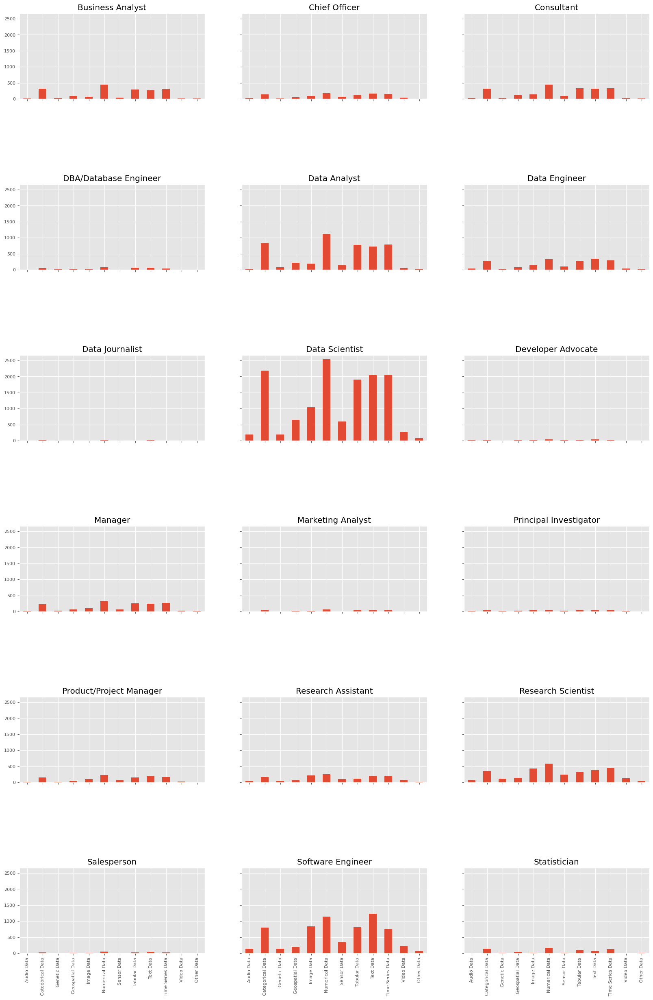

In [34]:
fig, ax = plt.subplots(nrows=6, ncols=3, sharex=True, sharey=True, figsize=(20, 30))
n = 1
for job in sum_datatype:
    plt.subplot(6, 3, n)
    sum_datatype[job].plot(kind="bar", title=job, fontsize=8)
    n +=1
plt.subplots_adjust(hspace = 1)
plt.show()

### Take away

1. Apparently, most of people regardless of occupation are working with numeric data.

2. Categorical, text, tabular and time series are also common!

3. Tecnical positions have more chance to explore more type of data.